# COMP9414 Assignment2
### Name: Renfei Yu (Klaus)
### zID: z5546743

### **Game Background**
- Based on the documentation on the Gymanisum website, every state in this game is represented by a Quadruple(Tr, Tc, P, D).    

 - T -> Since the environment is desined in a 2D map, the position where Taxi currently at is represened by (Tr, Tc) Tr refers to the row position and Tc refers to the column position.  

 - P -> represents the position of the customer, 0: Red, 1: Green, 2: Yellow, 3: Blue, 4: Inside the taxi

 - D -> represented the desitnation, 0: Red, 1: Green, 2: Yellow, 3: Blue

#### Game Step 1 
-  Initialize the game from S0 where Taxi is placed in (Tr, Tc)

#### Game Step 2
- We need to find the passenger so we need to go from S0 -> Sp (The position of passenger)  

#### Game Step 3
- We need to take the passenger to the destination so we need to go from Sp -> Sh (The position of destination)

<br><br>

In [85]:
import gym
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

env = gym.make("Taxi-v3", render_mode="ansi").env
state=env.reset()
rendered_env = env.render()
print(rendered_env)

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+




### **State Info**

- In order to construct a Q-Table, we need to know how many available states and actions there are in the **environment**. So we use env to get the number of states and actions  

- we need to later construct a Q-Table with the **row number of "number of states"** and **column number of "number of actions"**, since we have 500 states and 6 actions in this environment, so we will construct the Q-Table with size **500 Rows*6 Columns**



In [86]:
n_states = env.observation_space.n
n_actions = env.action_space.n

print("number of states: {}".format(n_states))
print("number of actions: {}".format(n_actions))


number of states: 500
number of actions: 6


## **Hyperparameters**

    - In this assignemnt, since we need to search in a Reinforcement Learning way, we do not need to manually set the heuristic functions, but no matter we use Q-learning or SARSA, we nned to empirically determine hyperparameters for both of them.  

    - These hyperparameters controls the size of each update, the weight of new information in each update, the probability of exploration, the balance between current and future rewards.

- ### **Learning rate α**
1. Control the ***weight*** of new information and existing information in each update.   

- α = 1 means it will be very sensitive to the new information and ignore the original Q-Value which will cause unstable of Q Value.  

- α = 0 means there will be no update for Q-Value and the algorithm will learn nothing.

    - Q(s,a) <- Q(s,a) + ***α[R+γmax Q(s',a')−Q(s,a)]***
        - e.g: in this part, the learning rate α controls the impact of the new information on the existing value function
        
2. The learning rate determines the ***size of each update***. If the learning rate is ***too high***, the learning process may be ***unstable***, if the learning rate is ***too low***, the learning speed will ***slow down*** and ***may not converge effectively***.  

    - e.g: in gradient descent, the learning rate controls the step size

<br><br>

- ### **Exploration parameters (such as ϵ or T)**
1. The exploration parameter is used to balance the trade-off between **exploration and exploitation**.
    - ***ϵ-Greedy Strategy***: ϵ represents the **probability of exploration**. In the ϵ-Greedy Strategy, the agent randomly selects actions with probability ϵ (exploration) and selects the currently estimated best action with probability 1−𝜖 (exploitation)  
        - ϵ = 1: Algorithm ***always selects randomized actions*** (full exploration), doesn't use known information to select the best action, ***cannot converge to the optimal strategy***  
        
        - ϵ = 0: The algorithm always chooses the action with the ***largest current Q value*** (full utilization). The algorithm will fall into the ***local optimal solution*** too early and ***fail to explore possible better solutions***.
    
    - ***Softmax strategy***: The softmax strategy uses a ***temperature parameter 𝑇*** &nbsp; to control the ***randomness of action selection***. The higher the temperature, the more random the action selection; the lower the temperature, the more certain the action selection based on which action is the ***most valuable*** one.  
    
<br><br>


- ### **Discount factor γ**
1. The discount factor is used to balance the impact of ***immediate rewards and future rewards***. It determines the impact of **future rewards on current decisions**.
    - The discount factor 𝛾 has a value **between 0 and 1**. 
    - A **high discount** factor (close to 1) means that **future rewards have a greater impact** on current decisions; 
        - γ = 1: only focus on future rewards. It may be ideal in some cases, but it may also cause the algorithm to be ***unstable or slow to converge*** in problems of ***infinite duration***.
    - A **low discount** factor (close to 0) means that **immediate rewards are more important**. 
        - γ = 0: The algorithm will only choose the action that currently yields the **greatest immediate reward**, **ignoring long-term payoffs**, which may be ***suboptimal*** in some tasks
<br><br>





## **Algorithm Implementation**

### **SARSA - On-Policy**

#### init
- In the __init__ function, the function will takes 2 inputs n_states and n_actions and initialize them in the program
- Also set learning rate α, Discount factor γ and Exploration parameters ϵ

- The Q value is a value that represents the value of taking a specific action in a specific state -> Q(s, a)  
    - In both sarsa and Q-Learning approach, it needs a q_table to store all Q-values of state-action pairs  


#### choose_action
- The action choose policy based on the ϵ-greedy method   

- When the random number falls in the range 0~epsilon: Use the random choice of action to do exploration  

- Otherwise, the action will choose to use the one that maximize the Q value


#### update
- Use the new_gained information and existing Q value to update the Q value in Q table  

- Since SARSA is an On-Policy agent -> The new_gained inforamtion is determined by the (state, action) pair in Q Table


In [100]:
class SARSA_agent:
    def __init__(self, n_states, n_actions):
        self.n_states = n_states
        self.n_actions = n_actions
        self.alpha = 0.00000001
        self.epsilon = 0.06
        self.gamma = 0.99

        # Used to store the Q-values ​​of all state-action pairs
        self.q_table = np.zeros((n_states, n_actions))


    def choose_action(self, state):
        if np.random.uniform(0, 1) < self.epsilon:
            # if the random generated number < value of epsilon
            # then start to explore by random choose action
            action = np.random.choice(self.n_actions)
        else:
            # if the random generated number >= epsilon
            # use greedy to exploitation
            action = np.argmax(self.q_table[state])
        return action


    def update(self, state, action, reward, next_state, next_action):
        # the existing q value get from the q-table according to state-action pair
        existing_qvalue = self.q_table[state, action]
        # based on the SARSA Update function, new gained information = 
        # reward + discount_factor * "q_value of the next state & action pair" - "q_value of current state & action pair"
        new_gained_information = reward + self.gamma * self.q_table[next_state, next_action] - existing_qvalue
        # # update the value in q-table by add the new gained information to the original q-value
        self.q_table[state, action] += self.alpha * new_gained_information


### **Q-learning - Off-Policy**  

#### Differences with SARSA 
- In the Q learning agent, I modified the hyperparameters for differnet values and tested for the best combination  

- Also, since Q-learning is an off-policy agent -> The new_gained information is determined by the maximum value based on the input state

In [96]:
class q_learning_agent:
    def __init__(self, n_states, n_actions):
        self.n_states = n_states
        self.n_actions = n_actions
        self.alpha = 0.00
        self.epsilon = 0.08
        self.gamma = 0.99
        
        # Used to store the Q-values ​​of all state-action pairs
        self.q_table = np.zeros((n_states, n_actions))


    def choose_action(self, state):
        if np.random.uniform(0, 1) < self.epsilon:
            # if the random generated number < value of epsilon
            # then start to explore by random choose action
            action = np.random.choice(self.n_actions)
        else:
            # if the random generated number >= epsilon
            # use greedy to exploitation
            action = np.argmax(self.q_table[state])
        return action

    def update(self, state, action, reward, next_state):
        # the existing q value get from the q-table according to state-action pair
        existing_qvalue = self.q_table[state, action]
        # based on the SARSA Update function, new gained information = 
        # reward + discount_factor * "q_value of the next state & action pair" - "q_value of current state & action pair"
        new_gained_information = reward + self.gamma * np.max(self.q_table[next_state]) - existing_qvalue
        # # update the value in q-table by add the new gained information to the original q-value
        self.q_table[state, action] += self.alpha * new_gained_information


## **Training**

#### Episode
- **number of Episodes** defines how many rounds of games we need to play  

#### Reward
- **reward_per_episode** stores the total rewards for each episode as a list  

- **total_reward** refers the accumulated reward in this game  

- **immediate_reward** refers the immediate reward that the agent got after doing an action at a state  

#### Steps
- **steps_per_episode** stores the steps it takes to complete the game for each episode  

- **count_step** will count the number of steps for current episode


#### Other variables
- **current_state**: The state code which been stored in the environment  

- **game_complete**: The indicator to show whether the current game has complete  

- **action**:The action which been chosen by the "choose_action" function in each agent

In [101]:
def train(agent, env, n_episodes):
    reward_per_episode = []
    steps_per_episode = []
    for episode in range(1, n_episodes + 1):
        state_attribute = env.reset()
        # get the first element in state_attribute list to get the code which represent the current state
        # so the state should be in the range 500 since there are 500 available states in the environment
        current_state = state_attribute[0]
        # game_complete represents whether the current game find the correct solution (an available path)
        game_complete = False

        # set the total reward(accumulated reward) to 0 before each episode starts
        total_reward = 0
        # current game didn't start yet so the step count = 0
        count_step = 0

        # choose an initial action
        action = agent.choose_action(current_state)

        while not game_complete:
            # get the attribute of next state
            next_state, immediate_reward, game_finish, truncated, info = env.step(action)
            next_action = agent.choose_action(next_state)
            if isinstance(agent, SARSA_agent):
                # use the sarsa update policy
                agent.update(current_state, action, immediate_reward, next_state, next_action)
            elif isinstance(agent, q_learning_agent):
                # use the q-learning update policy
                agent.update(current_state, action, immediate_reward, next_state)
            
            # update the state and action
            current_state = next_state
            action = next_action

            # add the immediate reward to the total reward
            total_reward += immediate_reward
            count_step += 1
            game_complete = game_finish
        
        # append this episode's reward to the rewards list and steps to the steps list 
        reward_per_episode.append(total_reward)
        steps_per_episode.append(count_step)

        # show the current process
        if(episode + 1) % 100 == 0:
            print(f"Episode {episode + 1}/{n_episodes}")
    
    return reward_per_episode, steps_per_episode

In [102]:
SARSA = SARSA_agent(n_states, n_actions)

print("Training Process for SARSA Agent")
# train sarsa Agent
sarsa_rewards, sarsa_steps = train(SARSA, env, 5000)


Training Process for SARSA Agent
Episode 100/5000
Episode 200/5000
Episode 300/5000
Episode 400/5000
Episode 500/5000
Episode 600/5000
Episode 700/5000
Episode 800/5000
Episode 900/5000
Episode 1000/5000
Episode 1100/5000
Episode 1200/5000
Episode 1300/5000
Episode 1400/5000
Episode 1500/5000
Episode 1600/5000
Episode 1700/5000
Episode 1800/5000
Episode 1900/5000
Episode 2000/5000
Episode 2100/5000
Episode 2200/5000
Episode 2300/5000
Episode 2400/5000
Episode 2500/5000
Episode 2600/5000
Episode 2700/5000
Episode 2800/5000
Episode 2900/5000
Episode 3000/5000
Episode 3100/5000
Episode 3200/5000
Episode 3300/5000
Episode 3400/5000
Episode 3500/5000
Episode 3600/5000
Episode 3700/5000
Episode 3800/5000
Episode 3900/5000
Episode 4000/5000
Episode 4100/5000
Episode 4200/5000
Episode 4300/5000
Episode 4400/5000
Episode 4500/5000
Episode 4600/5000
Episode 4700/5000
Episode 4800/5000
Episode 4900/5000
Episode 5000/5000


In [98]:
q_learning = q_learning_agent(n_states, n_actions)

print("Training Process for qlearning Agent")
# train q-learning Agent
q_learning_rewards, q_learning_steps = train(q_learning, env, 2000)


Training Process for qlearning Agent
Episode 100/2000
Episode 200/2000
Episode 300/2000
Episode 400/2000
Episode 500/2000
Episode 600/2000
Episode 700/2000
Episode 800/2000
Episode 900/2000
Episode 1000/2000
Episode 1100/2000
Episode 1200/2000
Episode 1300/2000
Episode 1400/2000
Episode 1500/2000
Episode 1600/2000
Episode 1700/2000
Episode 1800/2000
Episode 1900/2000
Episode 2000/2000


## **SARSA VS Q-Learning**
- Q-Learning: It may converge to the optimal solution ***faster in some cases***, but it may not perform as well as SARSA in some ***unstable environments***.  

- SARSA: ***More stable*** in situations with **large policy changes** or **high environmental noise**, but may ***converge more slowly*** in some cases


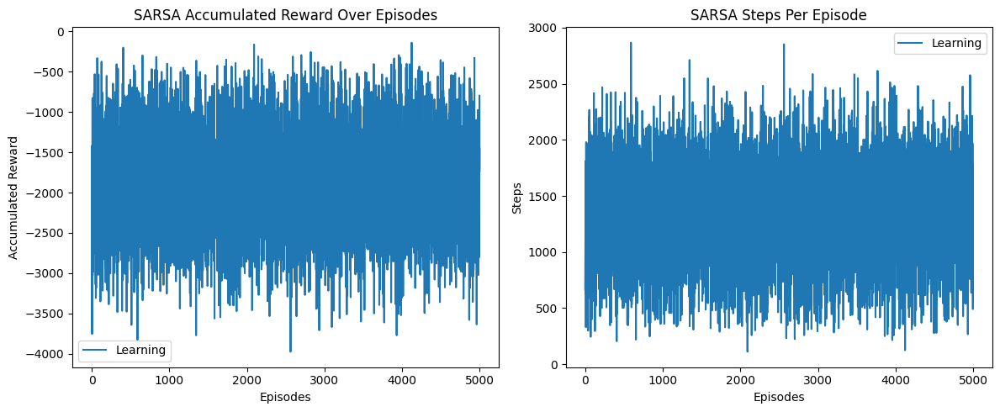

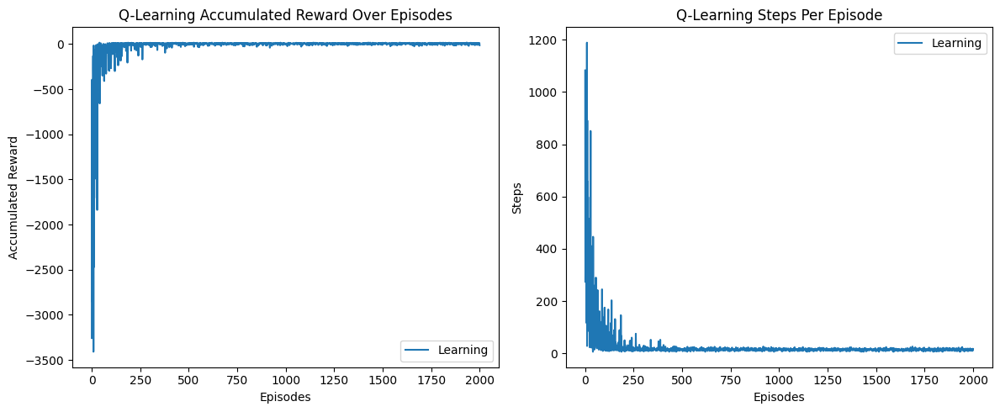

In [99]:
def plot_results(rewards, steps, title_prefix):
    episodes = range(len(rewards))
    
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(episodes, rewards, label='Learning')
    plt.xlabel('Episodes')
    plt.ylabel('Accumulated Reward')
    plt.title(f'{title_prefix} Accumulated Reward Over Episodes')
    plt.legend()
    
    plt.subplot(1, 2, 2)
    plt.plot(episodes, steps, label='Learning')
    plt.xlabel('Episodes')
    plt.ylabel('Steps')
    plt.title(f'{title_prefix} Steps Per Episode')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

# plot the result for both sarsa and Q-learning
plot_results(sarsa_rewards, sarsa_steps, "SARSA")
plot_results(q_learning_rewards, q_learning_steps, "Q-Learning")


# Save both Q-Tables
np.save("sarsa_q_table.npy", SARSA.q_table)
np.save("q_learning_q_table.npy", q_learning.q_table)


## **Script - do not use this since it's for discussion purpose**

## **Test**

#### **Test Environment Setup**

In [93]:
import gym
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

env = gym.make('Taxi-v3', render_mode='rgb_array').env
state_info = env.reset()
state = state_info if isinstance(state_info, int) else state_info[0]
game_complete = False



actions={
    0:"Move South",
    1:"Move North",
    2:"Move East",
    3:"Move West",
    4:"Pick Up Passenger",
    5:"Drop off Passenger"
}

n_states = env.observation_space.n
n_actions = env.action_space.n

print("number of states: {}".format(n_states))
print("number of actions: {}".format(n_actions))

number of states: 500
number of actions: 6


### **Testing Agent for average Reard and average Steps**

In [94]:
# Q-learning at most 14 steps per episode, and minimum 7 average accumulated reward
# SARSA at most 15 steps per episode on average, and minimum 5 average accumulated reward

def test_agent(q_table, env, episodes=100):
    # count total rewards
    total_rewards = 0
    # count total steps 
    total_steps = 0
    # count the episode that didn't finish in 100 steps (if any)
    jumped_episode = 0

    # go through 100 episodes
    for episode in range(episodes):
        state = env.reset()[0]
        game_complete = False
        episode_rewards = 0
        episode_steps = 0

        while not game_complete:
            # use the greddy action selection method
            action = np.argmax(q_table[state])
            next_state_attribute, immediate_reward, game_finish, truncated, info = env.step(action)

            # add the immediate rewards to the rewards of this episode
            episode_rewards += immediate_reward
            episode_steps += 1

            state = next_state_attribute

            # maximum 100 steps per episode, if exceed: break
            if episode_steps >= 100:
                game_complete = False
                break

            game_complete = game_finish or truncated
        
        # if game complete succesfsfully, count the rewards and steps
        if game_complete == True:
            total_rewards += episode_rewards
            total_steps += episode_steps
        else:
            jumped_episode += 1
            # from the forum discussion, since it didn't get the destination so no rewards
            # only add the steps
            total_steps += episode_steps

    # print the number of episodes that didn't finish in 100 steps
    print("jumped episode: {}".format(jumped_episode))
    average_reward = total_rewards / (episodes - jumped_episode)
    average_step = total_steps / (episodes - jumped_episode)

    # print the average rewards and number of steps
    print(f"Average Reward over {episodes} episodes: {average_reward}")
    print(f"Average Steps over {episodes} episodes: {average_step}")



#### **Testing Agent on SARSA**

In [95]:
loaded_sarsa_q_table = np.load("sarsa_q_table.npy")

print("Testing SARSA Agent...")
# run the test on SARSA's q_table
test_agent(loaded_sarsa_q_table, env)

Testing SARSA Agent...
jumped episode: 100


ZeroDivisionError: division by zero

#### **Testing Agent on Q-Learning**

In [ ]:
loaded_q_learning_q_table = np.load("q_learning_q_table.npy")

print("Testing Q-Leraning Agent...")
# run the test on Q-Learning's q_table
test_agent(loaded_q_learning_q_table, env)

Testing Q-Leraning Agent...
jumped episode: 0
Average Reward over 100 episodes: 7.66
Average Steps over 100 episodes: 13.34


#### **Visualizing Trained agent for SARSA**


 Step: 1, State: 272, Action: Move East, Reward: -1, Total Reward: -1


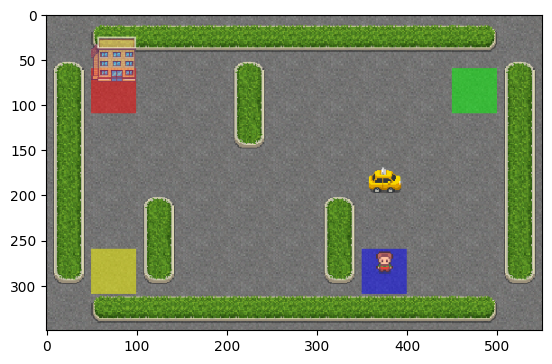


 Step: 2, State: 372, Action: Move South, Reward: -1, Total Reward: -2


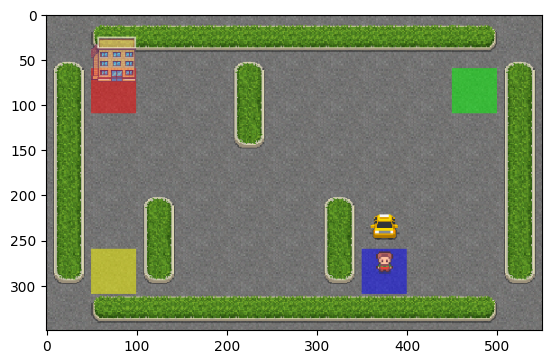


 Step: 3, State: 472, Action: Move South, Reward: -1, Total Reward: -3


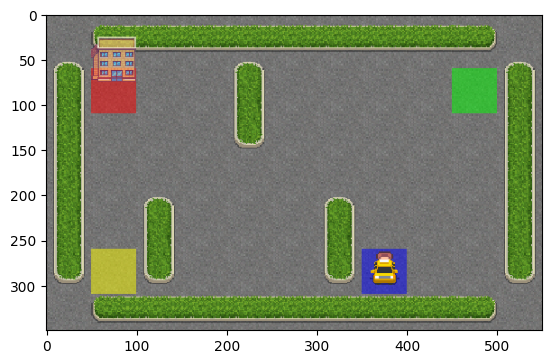


 Step: 4, State: 476, Action: Pick Up Passenger, Reward: -1, Total Reward: -4


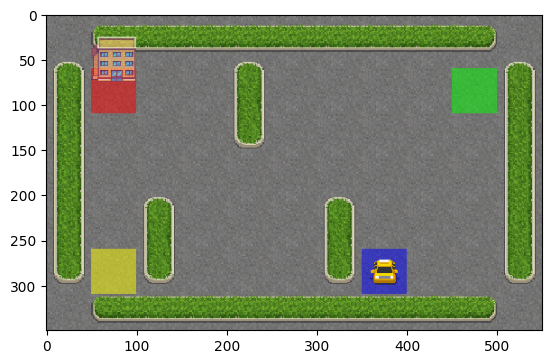


 Step: 5, State: 376, Action: Move North, Reward: -1, Total Reward: -5


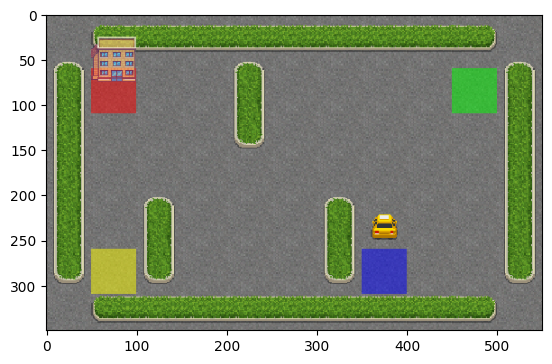


 Step: 6, State: 276, Action: Move North, Reward: -1, Total Reward: -6


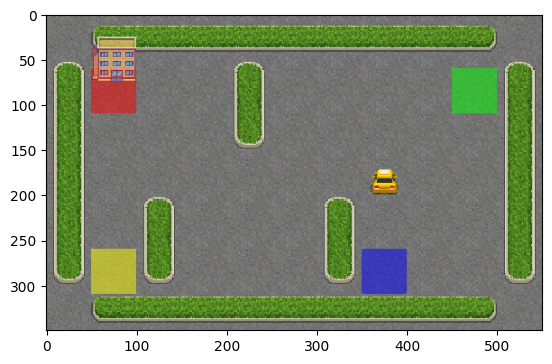


 Step: 7, State: 256, Action: Move West, Reward: -1, Total Reward: -7


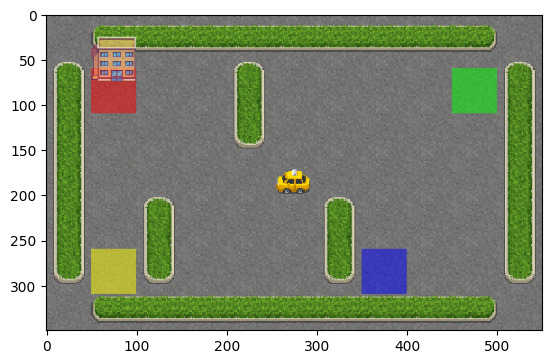


 Step: 8, State: 236, Action: Move West, Reward: -1, Total Reward: -8


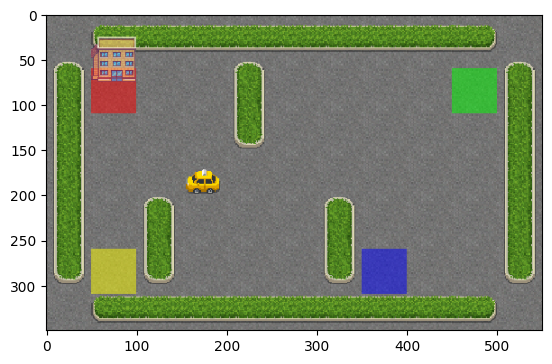


 Step: 9, State: 216, Action: Move West, Reward: -1, Total Reward: -9


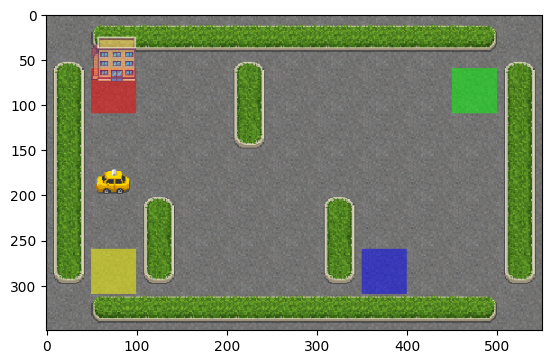


 Step: 10, State: 116, Action: Move North, Reward: -1, Total Reward: -10


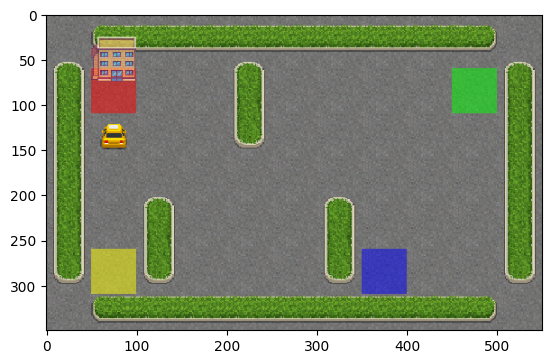


 Step: 11, State: 16, Action: Move North, Reward: -1, Total Reward: -11


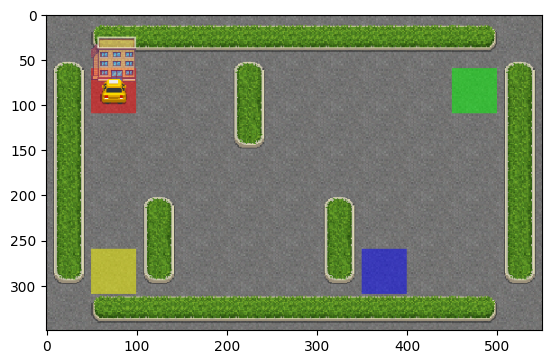


 Step: 12, State: 0, Action: Drop off Passenger, Reward: 20, Total Reward: 9


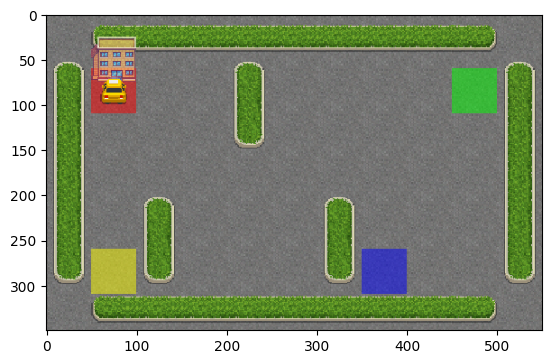

In [ ]:
game_complete = False

# set a new state for testing visualization
state = env.reset(seed=1)[0]
step_count = 0
total_reward = 0
while game_complete == False:
    # use the greddy action selection method 
    action = np.argmax(loaded_sarsa_q_table[state])
    state, immediate_reward, game_finish, truncated, info = env.step(action)

    step_count += 1 
    # add the immediate rewards to the rewards of this episode
    total_reward += immediate_reward
    output = actions.get(action)
    print("\n",f"Step: {step_count}, State: {state}, Action: {output}, Reward: {immediate_reward}, Total Reward: {total_reward}")

    game_complete = game_finish
    img = env.render()
    plt.imshow(img)
    plt.show()

#### **Visualizing Trained agent for Q-Learning**


 Step: 1, State: 142, Action: Move South, Reward: -1, Total Reward: -1


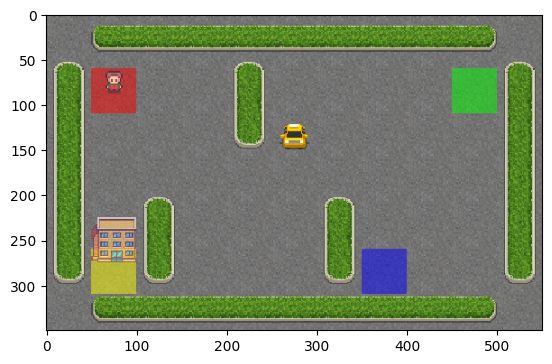


 Step: 2, State: 162, Action: Move East, Reward: -1, Total Reward: -2


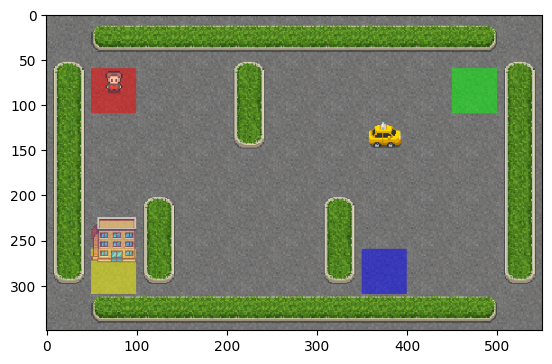


 Step: 3, State: 262, Action: Move South, Reward: -1, Total Reward: -3


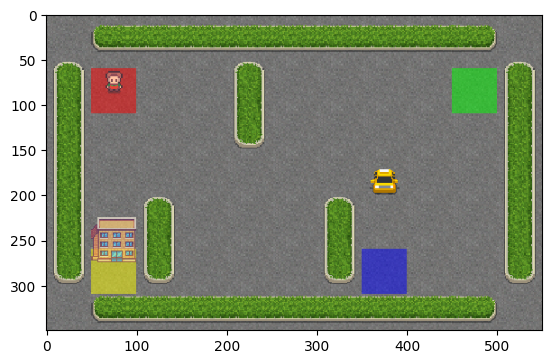


 Step: 4, State: 242, Action: Move West, Reward: -1, Total Reward: -4


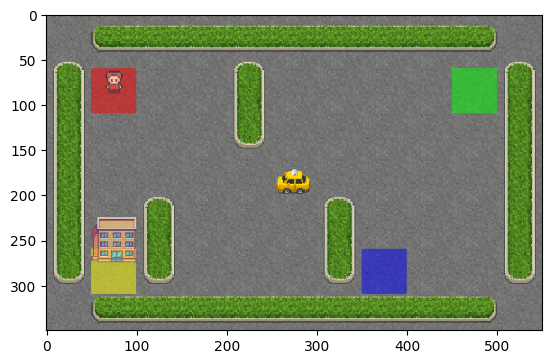


 Step: 5, State: 222, Action: Move West, Reward: -1, Total Reward: -5


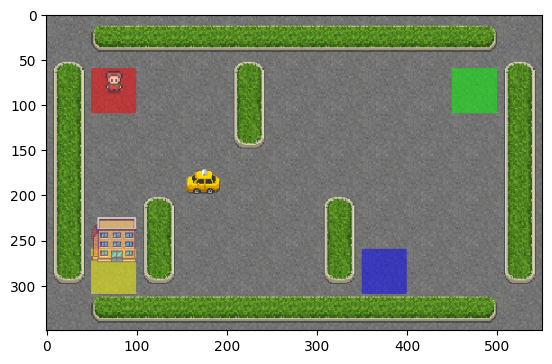


 Step: 6, State: 202, Action: Move West, Reward: -1, Total Reward: -6


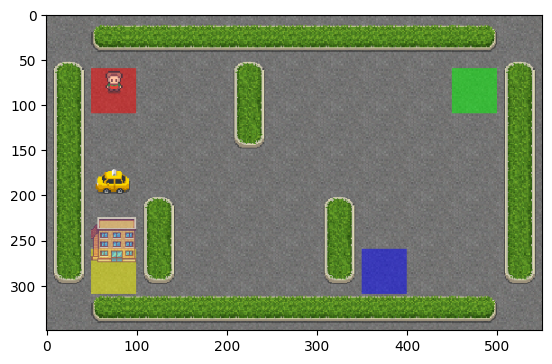


 Step: 7, State: 102, Action: Move North, Reward: -1, Total Reward: -7


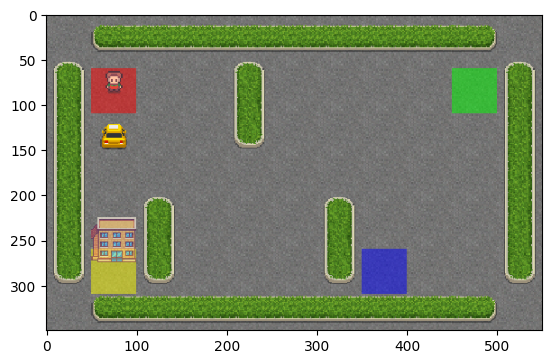


 Step: 8, State: 2, Action: Move North, Reward: -1, Total Reward: -8


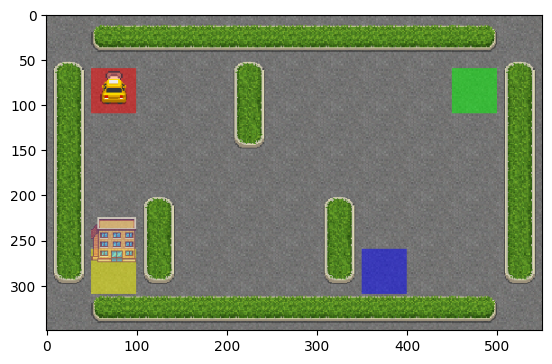


 Step: 9, State: 18, Action: Pick Up Passenger, Reward: -1, Total Reward: -9


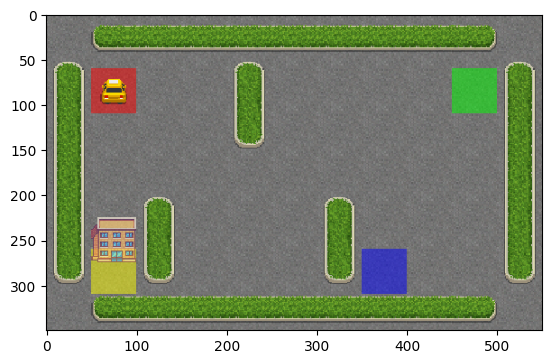


 Step: 10, State: 118, Action: Move South, Reward: -1, Total Reward: -10


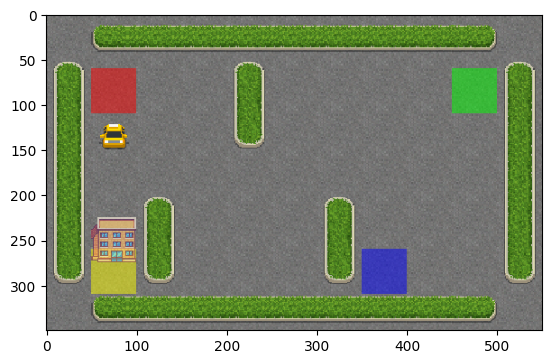


 Step: 11, State: 218, Action: Move South, Reward: -1, Total Reward: -11


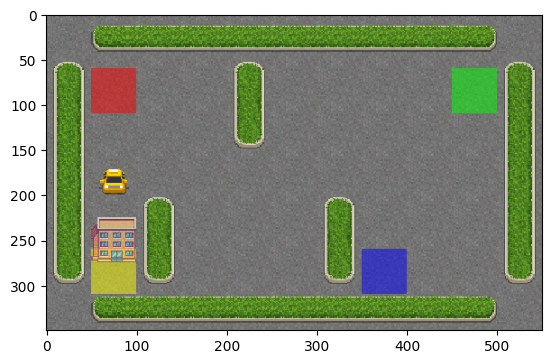


 Step: 12, State: 318, Action: Move South, Reward: -1, Total Reward: -12


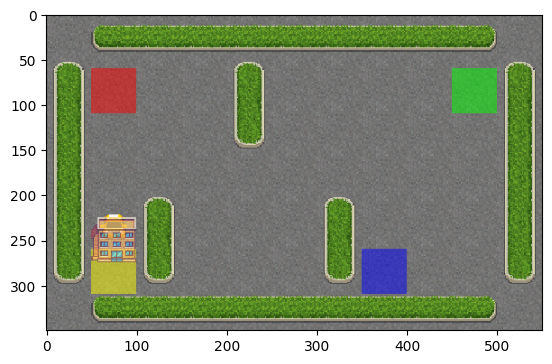


 Step: 13, State: 418, Action: Move South, Reward: -1, Total Reward: -13


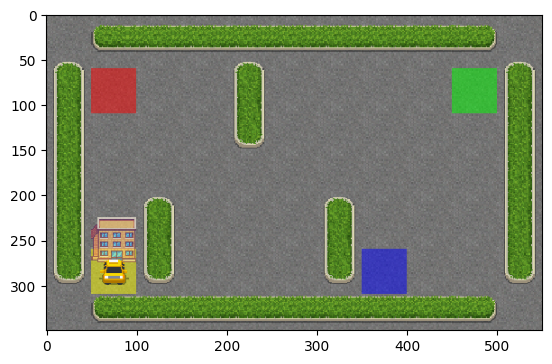


 Step: 14, State: 410, Action: Drop off Passenger, Reward: 20, Total Reward: 7


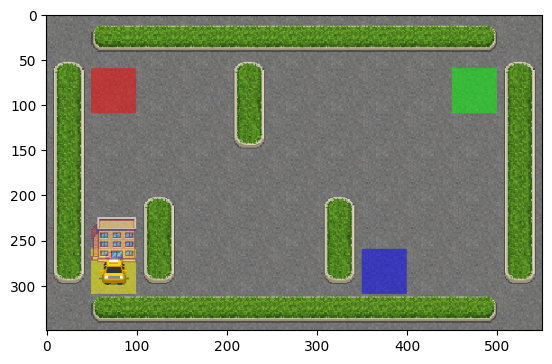

In [ ]:
game_complete = False

# set a new state for testing visualization
state = env.reset(seed=3)[0]
step_count = 0
total_reward = 0
while game_complete == False:
    # use the greddy action selection method 
    action = np.argmax(loaded_q_learning_q_table[state, :])
    state, immediate_reward, game_finish, truncated, info = env.step(action)

    step_count += 1 
    # add the immediate rewards to the rewards of this episode
    total_reward += immediate_reward
    output = actions.get(action)
    print("\n",f"Step: {step_count}, State: {state}, Action: {output}, Reward: {immediate_reward}, Total Reward: {total_reward}")

    game_complete = game_finish
    img = env.render()
    plt.imshow(img)
    plt.show()